In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

In [2]:
data = pd.read_csv('data_assignment.csv')

In [3]:
data

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,2778.3834
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,1193.1136
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,1845.5976


In [4]:
data.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [5]:
data.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [6]:
data.shape

(8523, 12)

In [7]:
data['Item_Type'].unique()

array(['Dairy', 'Soft Drinks', 'Meat', 'Fruits and Vegetables',
       'Household', 'Baking Goods', 'Snack Foods', 'Frozen Foods',
       'Breakfast', 'Health and Hygiene', 'Hard Drinks', 'Canned',
       'Breads', 'Starchy Foods', 'Others', 'Seafood'], dtype=object)

In [8]:
data['Item_Identifier'].unique()

array(['FDA15', 'DRC01', 'FDN15', ..., 'NCF55', 'NCW30', 'NCW05'],
      dtype=object)

In [9]:
data['Item_Identifier'].apply(lambda x : str(x)[:2]).value_counts()

FD    6125
NC    1599
DR     799
Name: Item_Identifier, dtype: int64

In [10]:
data['Item_Identifier_code'] = data['Item_Identifier'].apply(lambda x : str(x)[:2])

In [11]:
data[['Item_Identifier_code','Item_Type' ]]

,Item_Identifier_code,Item_Type
0,FD,Dairy
1,DR,Soft Drinks
2,FD,Meat
3,FD,Fruits and Vegetables
4,NC,Household
...,...,...
8518,FD,Snack Foods
8519,FD,Baking Goods
8520,NC,Health and Hygiene
8521,FD,Snack Foods


In [12]:
data.groupby('Item_Identifier_code')['Item_Type'].value_counts()

Item_Identifier_code  Item_Type            
DR                    Soft Drinks               445
                      Hard Drinks               214
                      Dairy                     140
FD                    Fruits and Vegetables    1232
                      Snack Foods              1200
                      Frozen Foods              856
                      Canned                    649
                      Baking Goods              648
                      Dairy                     542
                      Meat                      425
                      Breads                    251
                      Starchy Foods             148
                      Breakfast                 110
                      Seafood                    64
NC                    Household                 910
                      Health and Hygiene        520
                      Others                    169
Name: Item_Type, dtype: int64

In [13]:
data.groupby(['Item_Identifier','Item_Type'])['Item_Weight'].mean().reset_index().head(25)

,Item_Identifier,Item_Type,Item_Weight
0,DRA12,Soft Drinks,11.600
1,DRA24,Soft Drinks,19.350
2,DRA59,Soft Drinks,8.270
3,DRB01,Soft Drinks,7.390
4,DRB13,Soft Drinks,6.115
5,DRB24,Soft Drinks,8.785
6,DRB25,Soft Drinks,12.300
7,DRB48,Soft Drinks,16.750
8,DRC01,Soft Drinks,5.920
9,DRC12,Soft Drinks,17.850


<Axes: >

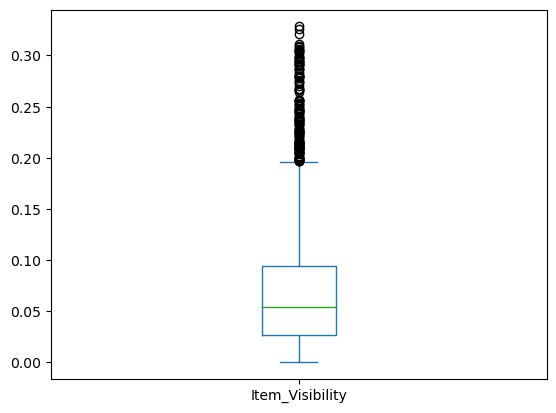

In [14]:
data.drop(columns=['Item_Weight','Item_MRP','Outlet_Establishment_Year','Item_Outlet_Sales']).plot(kind = 'box')


In [15]:
data['Item_Weight'] = data.groupby(['Item_Identifier_code','Item_Type']).Item_Weight.transform(lambda x: x.fillna(x.mean())
                                                                   )

In [16]:
data['Item_Weight'].isna().sum()

0

In [17]:
data.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Identifier_code
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,FD
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,DR
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,FD
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800,FD
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,NC


In [18]:
data['Item_Fat_Content'].value_counts()

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

In [19]:
data['Item_Fat_Content'].replace({'LF': 'Low Fat', 'reg':'Regular', 'low fat' : 'Low Fat'}, inplace = True)

In [20]:
data['Item_Fat_Content'].value_counts()

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

<Axes: ylabel='Frequency'>

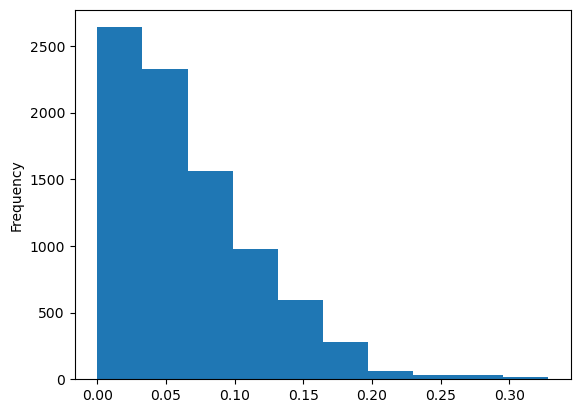

In [21]:
data['Item_Visibility'].plot(kind = 'hist')

In [22]:
data[data['Item_Visibility']==0.0].Item_Type.value_counts()


Fruits and Vegetables    87
Snack Foods              68
Household                51
Frozen Foods             51
Baking Goods             45
Dairy                    38
Soft Drinks              34
Health and Hygiene       33
Canned                   33
Meat                     20
Breads                   17
Hard Drinks              17
Starchy Foods            15
Others                   10
Seafood                   4
Breakfast                 3
Name: Item_Type, dtype: int64

In [23]:
data['Item_Type'].value_counts()

Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64

In [24]:
data['Outlet_Age'] = 2023 - data['Outlet_Establishment_Year']

In [25]:
del  data['Outlet_Establishment_Year']

In [26]:
data

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Identifier_code,Outlet_Age
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,Medium,Tier 1,Supermarket Type1,3735.1380,FD,24
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,Medium,Tier 3,Supermarket Type2,443.4228,DR,14
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,Medium,Tier 1,Supermarket Type1,2097.2700,FD,24
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,NaN,Tier 3,Grocery Store,732.3800,FD,25
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,High,Tier 3,Supermarket Type1,994.7052,NC,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,High,Tier 3,Supermarket Type1,2778.3834,FD,36
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,NaN,Tier 2,Supermarket Type1,549.2850,FD,21
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,Small,Tier 2,Supermarket Type1,1193.1136,NC,19
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,Medium,Tier 3,Supermarket Type2,1845.5976,FD,14


In [27]:
data['Outlet_Size'].isna().sum()

2410

In [28]:
data['Outlet_Identifier'].value_counts()

OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64

In [29]:
data['Outlet_Size'] = data.groupby(['Outlet_Type']).Outlet_Size.transform(lambda x: x.fillna(x.mode()[0]))


In [30]:
data.isna().sum()

Item_Identifier         0
Item_Weight             0
Item_Fat_Content        0
Item_Visibility         0
Item_Type               0
Item_MRP                0
Outlet_Identifier       0
Outlet_Size             0
Outlet_Location_Type    0
Outlet_Type             0
Item_Outlet_Sales       0
Item_Identifier_code    0
Outlet_Age              0
dtype: int64

In [31]:
data['Outlet_Location_Type'].value_counts()

Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64

In [32]:
!pip install pandas-profiling

In [33]:
import pandas_profiling as pp

C:\Users\Muthu\AppData\Local\Temp\ipykernel_10212\1872674328.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [34]:
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:
data['Outlet_Identifier'].nunique()

10

In [36]:
data.select_dtypes(exclude = np.number)

,Item_Identifier,Item_Fat_Content,Item_Type,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Identifier_code
0,FDA15,Low Fat,Dairy,OUT049,Medium,Tier 1,Supermarket Type1,FD
1,DRC01,Regular,Soft Drinks,OUT018,Medium,Tier 3,Supermarket Type2,DR
2,FDN15,Low Fat,Meat,OUT049,Medium,Tier 1,Supermarket Type1,FD
3,FDX07,Regular,Fruits and Vegetables,OUT010,Small,Tier 3,Grocery Store,FD
4,NCD19,Low Fat,Household,OUT013,High,Tier 3,Supermarket Type1,NC
...,...,...,...,...,...,...,...,...
8518,FDF22,Low Fat,Snack Foods,OUT013,High,Tier 3,Supermarket Type1,FD
8519,FDS36,Regular,Baking Goods,OUT045,Small,Tier 2,Supermarket Type1,FD
8520,NCJ29,Low Fat,Health and Hygiene,OUT035,Small,Tier 2,Supermarket Type1,NC
8521,FDN46,Regular,Snack Foods,OUT018,Medium,Tier 3,Supermarket Type2,FD


In [37]:
# Please complete this

In [38]:
#1. Drop the Item identifier
#2. convert all other categorical data to one hot
#3. concat the numerical data and one hoted categorical data
#4. split train and test
#5. build the model on train
#6. predict the train
#7. find the train error
#8. predict on test
#9. find the test error
#10. compare the train and test error

In [39]:
data.duplicated().sum()

0

In [40]:
data.drop(columns='Item_Identifier',inplace=True)

In [41]:
data['Item_Fat_Content'].value_counts()

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [42]:
data_fat_content=pd.get_dummies(data['Item_Fat_Content'])

In [43]:
data['Item_Type'].value_counts()

Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64

In [44]:
data_itemtype=pd.get_dummies(data['Item_Type'])

In [45]:
data['Outlet_Identifier'].value_counts()

OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64

In [46]:
data_outlet_id=pd.get_dummies(data['Outlet_Identifier'])

In [47]:
data['Outlet_Size'].value_counts()

Small     4798
Medium    2793
High       932
Name: Outlet_Size, dtype: int64

In [48]:
data_outlet_size=pd.get_dummies(data['Outlet_Size'])

In [49]:
data['Outlet_Location_Type'].value_counts()

Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64

In [50]:
data_item_loc=pd.get_dummies(data['Outlet_Location_Type'])

In [51]:
data['Outlet_Type'].value_counts()

Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int64

In [52]:
data_outlet_type=pd.get_dummies(data['Outlet_Type'])

In [53]:
data['Item_Identifier_code'].value_counts()

FD    6125
NC    1599
DR     799
Name: Item_Identifier_code, dtype: int64

In [54]:
data_item_identifier=pd.get_dummies(data['Item_Identifier_code'])

In [55]:
data_fat_content=data_fat_content.reset_index().drop(columns='index')
data_itemtype=data_itemtype.reset_index().drop(columns='index')
data_outlet_id=data_outlet_id.reset_index().drop(columns='index')
data_outlet_size=data_outlet_size.reset_index().drop(columns='index')
data_item_loc=data_item_loc.reset_index().drop(columns='index')
data_outlet_type=data_outlet_type.reset_index().drop(columns='index')
data_item_identifier=data_item_identifier.reset_index().drop(columns='index')

In [56]:
data_number=pd.DataFrame(data.select_dtypes(include = np.number))

In [57]:
data_number=data_number.reset_index().drop(columns='index')

In [58]:
new_data=pd.concat([data_fat_content,data_itemtype,data_outlet_id,data_outlet_size,data_item_loc,data_outlet_type,data_item_identifier,data_number],axis=1)

In [59]:
new_data

,Low Fat,Regular,Baking Goods,Breads,Breakfast,Canned,Dairy,Frozen Foods,Fruits and Vegetables,Hard Drinks,...,Supermarket Type2,Supermarket Type3,DR,FD,NC,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Outlet_Age
0,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,9.300,0.016047,249.8092,3735.1380,24
1,0,1,0,0,0,0,0,0,0,0,...,1,0,1,0,0,5.920,0.019278,48.2692,443.4228,14
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,17.500,0.016760,141.6180,2097.2700,24
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,1,0,19.200,0.000000,182.0950,732.3800,25
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,8.930,0.000000,53.8614,994.7052,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8518,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,6.865,0.056783,214.5218,2778.3834,36
8519,0,1,1,0,0,0,0,0,0,0,...,0,0,0,1,0,8.380,0.046982,108.1570,549.2850,21
8520,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,10.600,0.035186,85.1224,1193.1136,19
8521,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,0,7.210,0.145221,103.1332,1845.5976,14


In [60]:
pp.ProfileReport(new_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

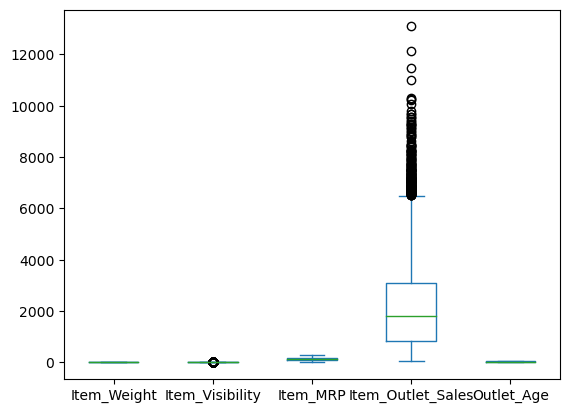

In [61]:
data_number.plot(kind='box')

<Axes: >

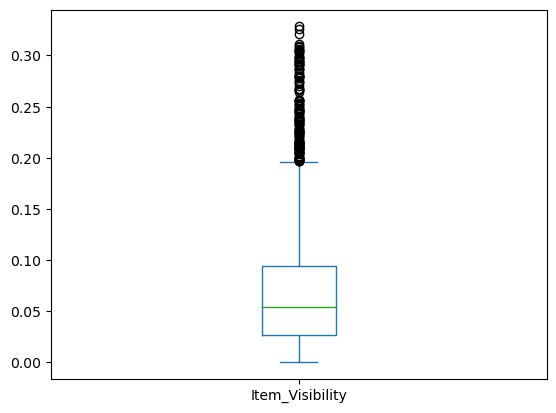

In [62]:
data_number['Item_Visibility'].plot(kind='box')

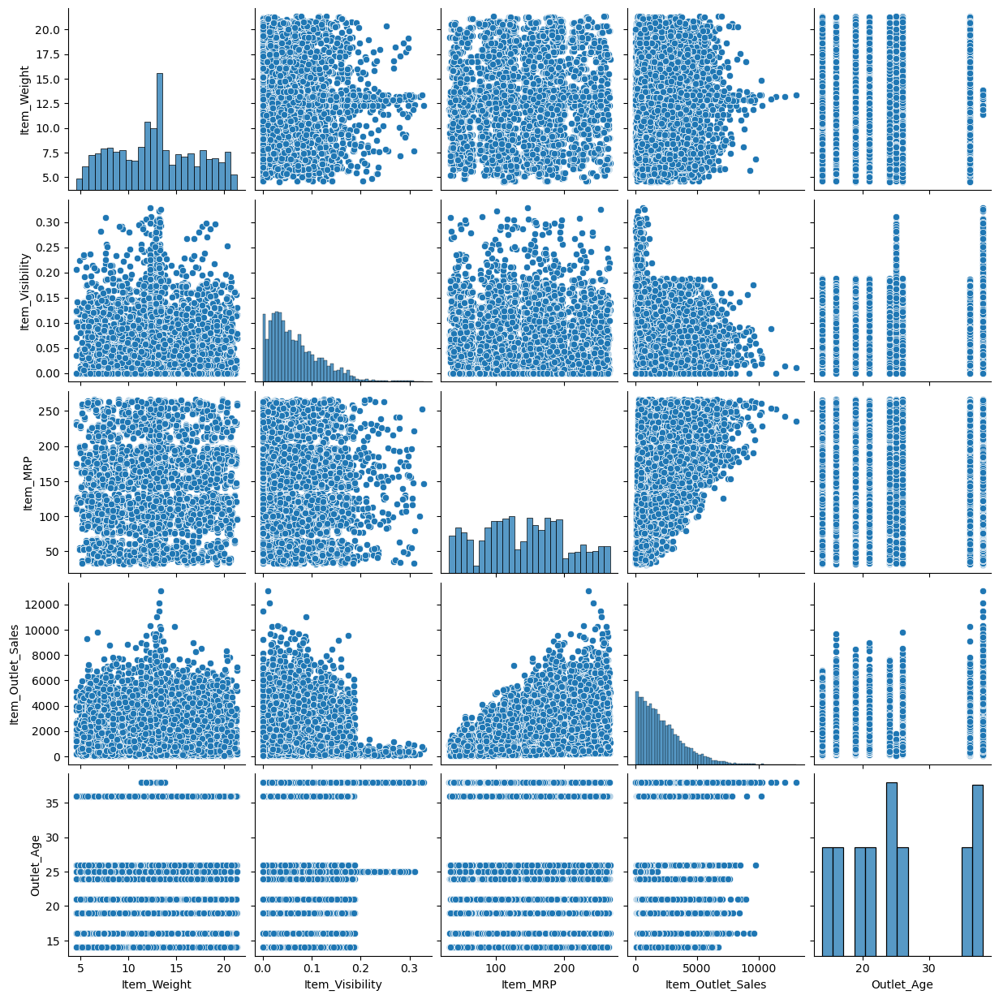

In [63]:
sns.pairplot(data)

In [64]:
data_number

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Outlet_Age
0,9.300,0.016047,249.8092,3735.1380,24
1,5.920,0.019278,48.2692,443.4228,14
2,17.500,0.016760,141.6180,2097.2700,24
3,19.200,0.000000,182.0950,732.3800,25
4,8.930,0.000000,53.8614,994.7052,36
...,...,...,...,...,...
8518,6.865,0.056783,214.5218,2778.3834,36
8519,8.380,0.046982,108.1570,549.2850,21
8520,10.600,0.035186,85.1224,1193.1136,19
8521,7.210,0.145221,103.1332,1845.5976,14


In [65]:
data.corr()

C:\Users\Muthu\AppData\Local\Temp\ipykernel_10212\2627137660.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.corr()


,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Outlet_Age
Item_Weight,1.000000,-0.011781,0.025671,0.011952,0.008329
Item_Visibility,-0.011781,1.000000,-0.001315,-0.128625,0.074834
Item_MRP,0.025671,-0.001315,1.000000,0.567574,-0.005020
Item_Outlet_Sales,0.011952,-0.128625,0.567574,1.000000,0.049135
Outlet_Age,0.008329,0.074834,-0.005020,0.049135,1.000000


C:\Users\Muthu\AppData\Local\Temp\ipykernel_10212\2578434383.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(),annot=True)


<Axes: >

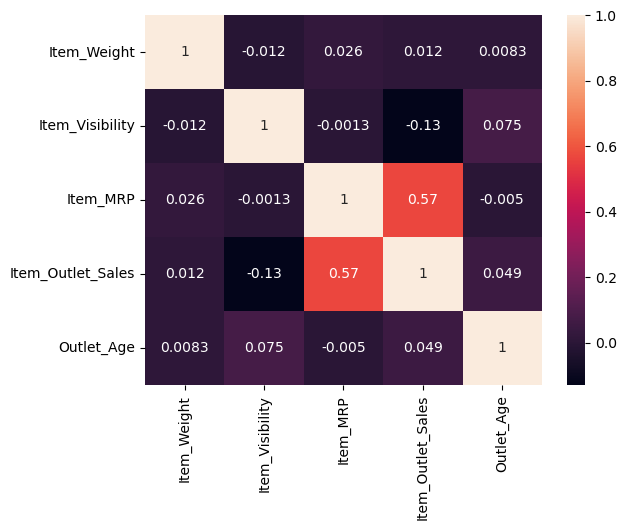

In [66]:
sns.heatmap(data.corr(),annot=True)

In [67]:
[variance_inflation_factor(data[['Item_Weight','Item_Visibility','Item_MRP','Outlet_Age']].values,i) for i in range(data[['Item_Weight','Item_Visibility','Item_MRP','Outlet_Age']].shape[1])]

[6.653500175720877, 2.530741566663221, 4.948531195259647, 6.718943634128103]

<Axes: >

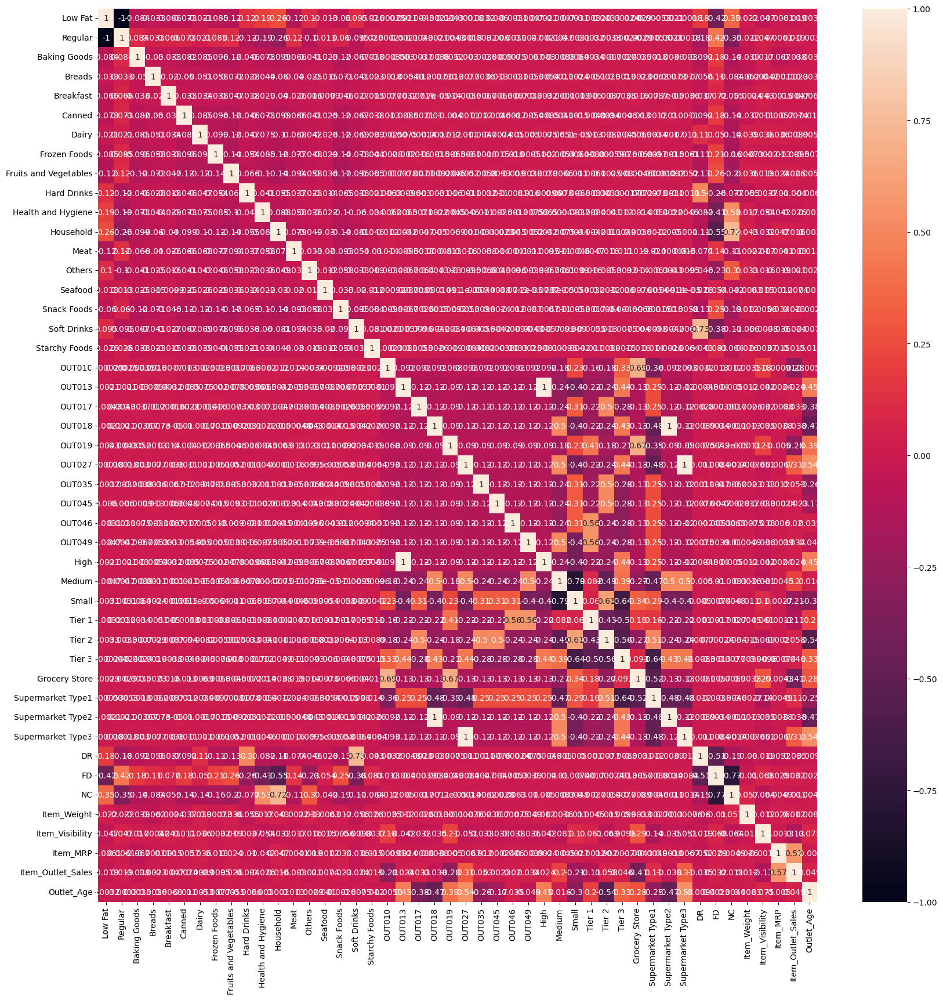

In [68]:
plt.figure(figsize=(20,20))
sns.heatmap(new_data.corr(),annot=True)

In [69]:
x = new_data.drop(columns = 'Item_Outlet_Sales')

In [70]:
y=new_data['Item_Outlet_Sales']

In [71]:
train_x,test_x,train_y,test_y=train_test_split(x,y,test_size=0.2,random_state=2)

In [72]:
train_x.shape

(6818, 45)

In [73]:
scale=StandardScaler()

In [74]:
scale.fit(train_x)

StandardScaler()

In [75]:
scale_train_x=pd.DataFrame(scale.transform(train_x),columns=train_x.columns)
scale_test_x=pd.DataFrame(scale.transform(test_x),columns=test_x.columns)

In [76]:
scale_train_x

,Low Fat,Regular,Baking Goods,Breads,Breakfast,Canned,Dairy,Frozen Foods,Fruits and Vegetables,Hard Drinks,...,Supermarket Type1,Supermarket Type2,Supermarket Type3,DR,FD,NC,Item_Weight,Item_Visibility,Item_MRP,Outlet_Age
0,-1.363781,1.363781,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-0.241353,-0.170030,0.142044,0.099938
1,0.733255,-0.733255,3.502084,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,-1.384708,-0.346012,2.876837,-0.320748,0.625869,-0.481454,-0.128826,-1.285498,-0.658577,1.533910
2,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,3.472939,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-1.202452,-0.357270,1.736475,0.099938
3,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,2.970557,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-0.547961,-0.264562,-0.826672,0.099938
4,-1.363781,1.363781,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,-1.384708,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,0.038811,3.296290,-1.526724,1.533910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6813,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-1.318020,0.656367,0.847977,0.099938
6814,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,1.539333,1.008758,1.345789,0.099938
6815,-1.363781,1.363781,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,1.386029,0.503551,0.678908,-1.095039
6816,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,6.310812,...,0.722174,-0.346012,-0.347604,3.117712,-1.597777,-0.481454,-0.930042,0.403726,0.184354,-0.497551


# Modeling

# Item_Weight

<Axes: xlabel='Item_Weight', ylabel='Item_Outlet_Sales'>

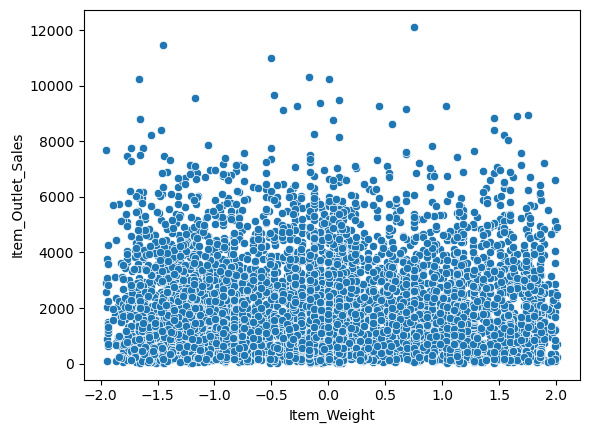

In [77]:
sns.scatterplot(x=scale_train_x['Item_Weight'],y=train_y)

In [78]:
reg=LinearRegression()

In [79]:
reg.fit(scale_train_x[['Item_Weight']],train_y)

LinearRegression()

In [80]:
reg.intercept_

2167.583479847463

In [81]:
reg.coef_

array([8.62903014])

In [82]:
scale_train_x

,Low Fat,Regular,Baking Goods,Breads,Breakfast,Canned,Dairy,Frozen Foods,Fruits and Vegetables,Hard Drinks,...,Supermarket Type1,Supermarket Type2,Supermarket Type3,DR,FD,NC,Item_Weight,Item_Visibility,Item_MRP,Outlet_Age
0,-1.363781,1.363781,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-0.241353,-0.170030,0.142044,0.099938
1,0.733255,-0.733255,3.502084,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,-1.384708,-0.346012,2.876837,-0.320748,0.625869,-0.481454,-0.128826,-1.285498,-0.658577,1.533910
2,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,3.472939,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-1.202452,-0.357270,1.736475,0.099938
3,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,2.970557,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-0.547961,-0.264562,-0.826672,0.099938
4,-1.363781,1.363781,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,-1.384708,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,0.038811,3.296290,-1.526724,1.533910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6813,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,-1.318020,0.656367,0.847977,0.099938
6814,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,1.539333,1.008758,1.345789,0.099938
6815,-1.363781,1.363781,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,-0.158458,...,0.722174,-0.346012,-0.347604,-0.320748,0.625869,-0.481454,1.386029,0.503551,0.678908,-1.095039
6816,0.733255,-0.733255,-0.285544,-0.176509,-0.118872,-0.287941,-0.292101,-0.336637,-0.40727,6.310812,...,0.722174,-0.346012,-0.347604,3.117712,-1.597777,-0.481454,-0.930042,0.403726,0.184354,-0.497551


In [83]:
train_predict_Item_Weight=reg.predict(scale_train_x[['Item_Weight']])

Text(0, 0.5, 'Item_Outlet_Sales')

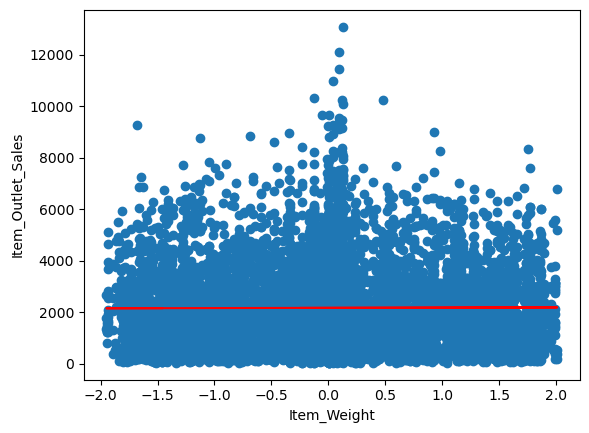

In [84]:
plt.scatter(scale_train_x['Item_Weight'],train_y)
plt.plot(scale_train_x['Item_Weight'],reg.predict(scale_train_x[['Item_Weight']]),color='red')
plt.xlabel('Item_Weight')
plt.ylabel('Item_Outlet_Sales')

In [85]:
test_predict_Item_Weight = reg.predict(scale_test_x[['Item_Weight']])

In [86]:
test_predict_Item_Weight

array([2168.4004965 , 2166.21314949, 2153.28976917, ..., 2180.35763662,
       2179.54356541, 2155.28424361])

Text(0, 0.5, 'Item_Outlet_Sales')

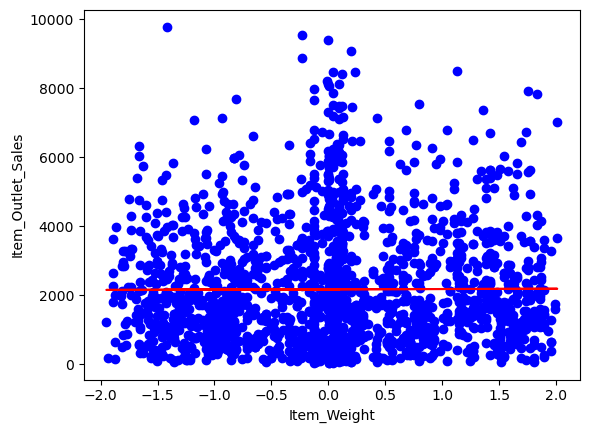

In [87]:
plt.scatter(scale_test_x['Item_Weight'], test_y, color = 'blue')
plt.plot(scale_test_x['Item_Weight'], reg.predict(scale_test_x[['Item_Weight']]), color = 'red')
plt.xlabel("Item_Weight")
plt.ylabel('Item_Outlet_Sales')

Text(0, 0.5, 'Item_Outlet_Sales')

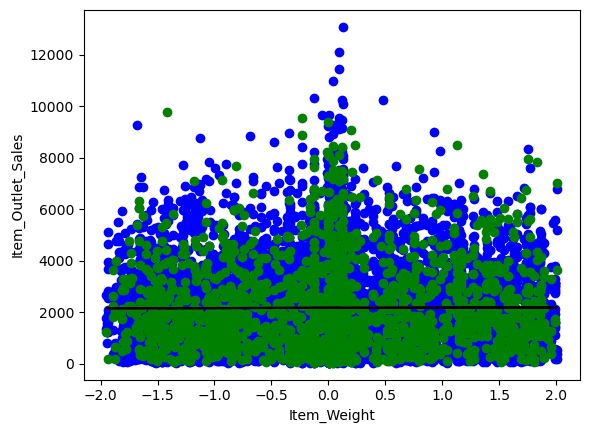

In [88]:
plt.scatter(scale_train_x['Item_Weight'], train_y, color = 'blue')
plt.scatter(scale_test_x['Item_Weight'], test_y, color = 'green')
plt.plot(scale_train_x['Item_Weight'], reg.predict(scale_train_x[['Item_Weight']]), color = 'red')
plt.plot(scale_test_x['Item_Weight'], reg.predict(scale_test_x[['Item_Weight']]), color = 'black')
plt.xlabel("Item_Weight")
plt.ylabel('Item_Outlet_Sales')

# error metric

In [89]:
def returnerror(actual,predict):
    mse=mean_squared_error(actual,predict)
    rmse=np.sqrt(mean_squared_error(actual,predict))
    mae=mean_absolute_error(actual,predict)
    mape = mean_absolute_percentage_error(actual,predict)
    r2 = r2_score(actual,predict)
    print("MSE = ", mse)
    print("RMSE = ", rmse)
    print("MAE = ", mae)
    print("MAPE = ", mape)
    print("R2 Score = ", r2)

In [90]:
print('TRAIN ERROR')
returnerror(train_y,reg.predict(scale_train_x[['Item_Weight']]))

TRAIN ERROR
MSE =  2866954.106904848
RMSE =  1693.208229044747
MAE =  1336.6289804898502
MAPE =  2.2022863110930495
R2 Score =  2.59711960914899e-05


In [91]:
print('TEST ERROR')
returnerror(test_y,reg.predict(scale_test_x[['Item_Weight']]))

TEST ERROR
MSE =  3090671.228801414
RMSE =  1758.030497119266
MAE =  1373.9983227075097
MAPE =  2.0827968787339386
R2 Score =  -0.0011650247155450266


In [92]:
# test error is greater than train error

# Item_visiblity vs sales

<Axes: xlabel='Item_Visibility', ylabel='Item_Outlet_Sales'>

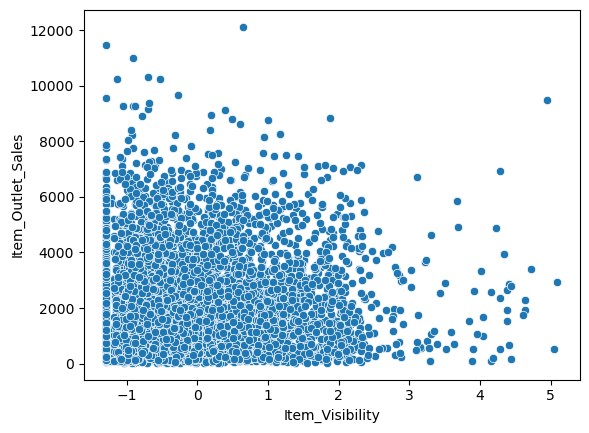

In [93]:
sns.scatterplot(x=scale_train_x['Item_Visibility'],y=train_y)

In [94]:
reg=LinearRegression()

In [95]:
reg.fit(scale_train_x[['Item_Visibility']],train_y)

LinearRegression()

In [96]:
reg.intercept_

2167.583479847463

In [97]:
reg.coef_

array([-210.05810628])

In [98]:
train_predict_Item_visiblity=reg.predict(scale_train_x[['Item_Visibility']])

Text(0, 0.5, 'Item_Outlet_Sales')

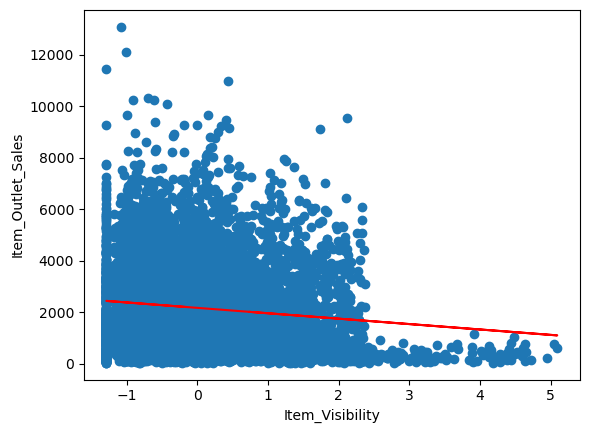

In [99]:
plt.scatter(scale_train_x['Item_Visibility'],train_y)
plt.plot(scale_train_x['Item_Visibility'],reg.predict(scale_train_x[['Item_Visibility']]),color='red')
plt.xlabel('Item_Visibility')
plt.ylabel('Item_Outlet_Sales')

In [100]:
test_predict_Item_visiblity = reg.predict(scale_test_x[['Item_Visibility']])

In [101]:
test_predict_Item_visiblity

array([2030.58577951, 1901.23828075, 1902.15418596, ..., 1710.15773897,
       2437.61277018, 2086.75695959])

Text(0, 0.5, 'Item_Outlet_Sales')

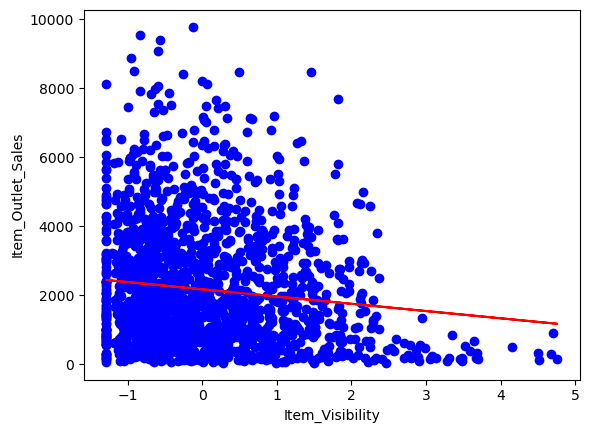

In [102]:
plt.scatter(scale_test_x['Item_Visibility'], test_y, color = 'blue')
plt.plot(scale_test_x['Item_Visibility'], reg.predict(scale_test_x[['Item_Visibility']]), color = 'red')
plt.xlabel("Item_Visibility")
plt.ylabel('Item_Outlet_Sales')

Text(0, 0.5, 'Item_Outlet_Sales')

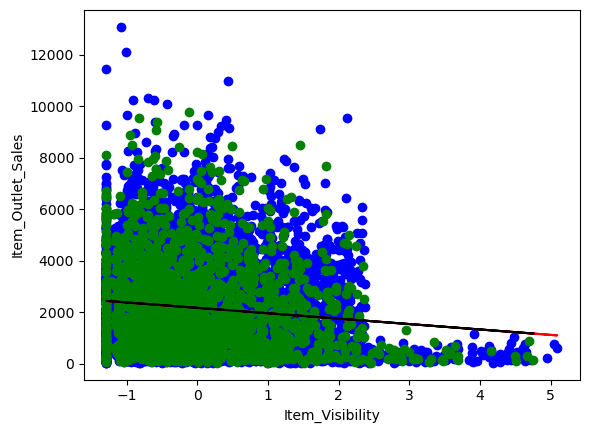

In [103]:
plt.scatter(scale_train_x['Item_Visibility'], train_y, color = 'blue')
plt.scatter(scale_test_x['Item_Visibility'], test_y, color = 'green')
plt.plot(scale_train_x['Item_Visibility'], reg.predict(scale_train_x[['Item_Visibility']]), color = 'red')
plt.plot(scale_test_x['Item_Visibility'], reg.predict(scale_test_x[['Item_Visibility']]), color = 'black')
plt.xlabel("Item_Visibility")
plt.ylabel('Item_Outlet_Sales')

In [104]:
print('TRAIN ERROR')
returnerror(train_y,reg.predict(scale_train_x[['Item_Visibility']]))

TRAIN ERROR
MSE =  2822904.159053048
RMSE =  1680.1500406371592
MAE =  1322.4637994900904
MAPE =  2.1081009401912976
R2 Score =  0.015390292416259665


In [105]:
print('TEST ERROR')
returnerror(test_y,reg.predict(scale_test_x[['Item_Visibility']]))

TEST ERROR
MSE =  3027779.376455663
RMSE =  1740.0515441950743
MAE =  1357.1104695395002
MAPE =  1.9834791271933103
R2 Score =  0.01920761224479539


In [106]:
#test error is greater than train error

# Item_mrp vs sales

<Axes: xlabel='Item_MRP', ylabel='Item_Outlet_Sales'>

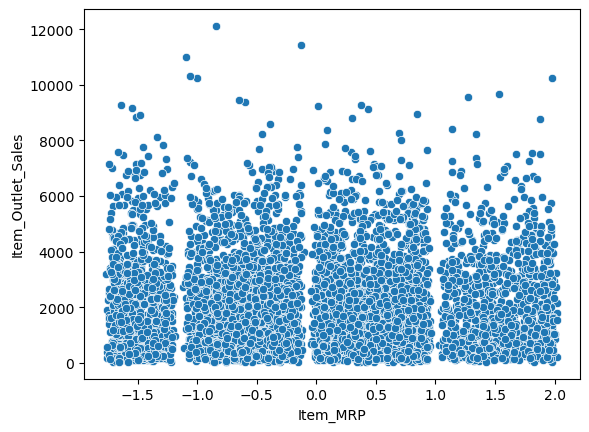

In [107]:
sns.scatterplot(x=scale_train_x['Item_MRP'],y=train_y)

In [108]:
reg.fit(scale_train_x[['Item_MRP']],train_y)

LinearRegression()

In [109]:
reg.intercept_

2167.583479847463

In [110]:
reg.coef_

array([971.37915318])

In [111]:
train_predict_Item_MRP=reg.predict(scale_train_x[['Item_MRP']])

Text(0, 0.5, 'Item_Outlet_Sales')

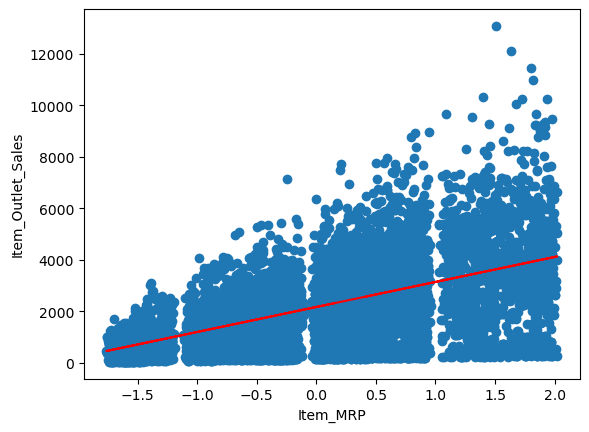

In [112]:
plt.scatter(scale_train_x['Item_MRP'],train_y)
plt.plot(scale_train_x['Item_MRP'],reg.predict(scale_train_x[['Item_MRP']]),color='red')
plt.xlabel('Item_MRP')
plt.ylabel('Item_Outlet_Sales')

In [113]:
test_predict_Item_MRP = reg.predict(scale_test_x[['Item_MRP']])

Text(0, 0.5, 'Item_Outlet_Sales')

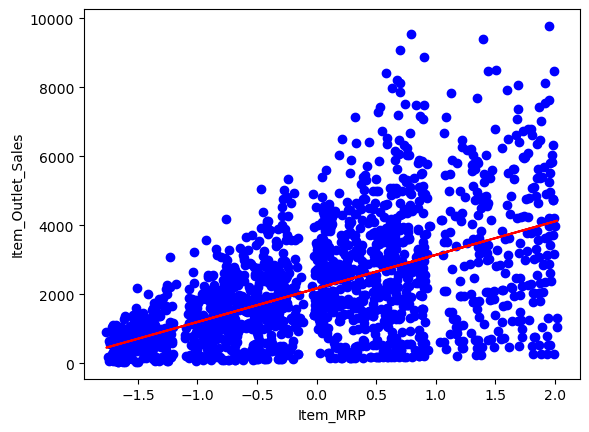

In [114]:
plt.scatter(scale_test_x['Item_MRP'], test_y, color = 'blue')
plt.plot(scale_test_x['Item_MRP'], reg.predict(scale_test_x[['Item_MRP']]), color = 'red')
plt.xlabel("Item_MRP")
plt.ylabel('Item_Outlet_Sales')

Text(0, 0.5, 'Item_Outlet_Sales')

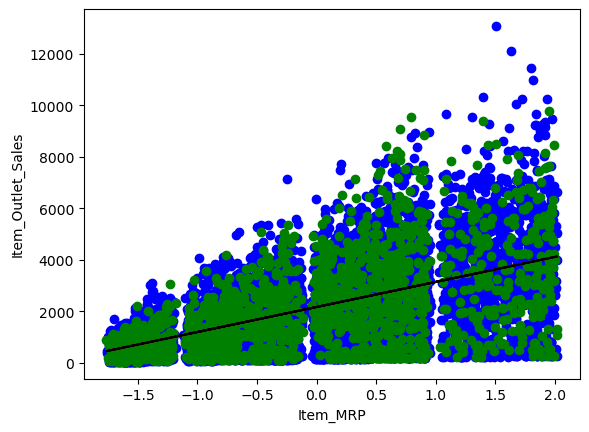

In [115]:
plt.scatter(scale_train_x['Item_MRP'], train_y, color = 'blue')
plt.scatter(scale_test_x['Item_MRP'], test_y, color = 'green')
plt.plot(scale_train_x['Item_MRP'], reg.predict(scale_train_x[['Item_MRP']]), color = 'red')
plt.plot(scale_test_x['Item_MRP'], reg.predict(scale_test_x[['Item_MRP']]), color = 'black')
plt.xlabel("Item_MRP")
plt.ylabel('Item_Outlet_Sales')

In [116]:
print('TRAIN ERROR')
returnerror(train_y,reg.predict(scale_train_x[['Item_MRP']]))

TRAIN ERROR
MSE =  1923451.1078383937
RMSE =  1386.8853982353385
MAE =  1018.3902406004281
MAPE =  1.43189420958163
R2 Score =  0.32911337894104076


In [117]:
print('TEST ERROR')
returnerror(test_y,reg.predict(scale_test_x[['Item_MRP']]))

TEST ERROR
MSE =  2176352.648161309
RMSE =  1475.2466397729258
MAE =  1082.3860561273118
MAPE =  1.3876629551821744
R2 Score =  0.29501134495267944


In [118]:
#MSE OF test data greater than train data

# Outlet_Age vs sales

<Axes: xlabel='Outlet_Age', ylabel='Item_Outlet_Sales'>

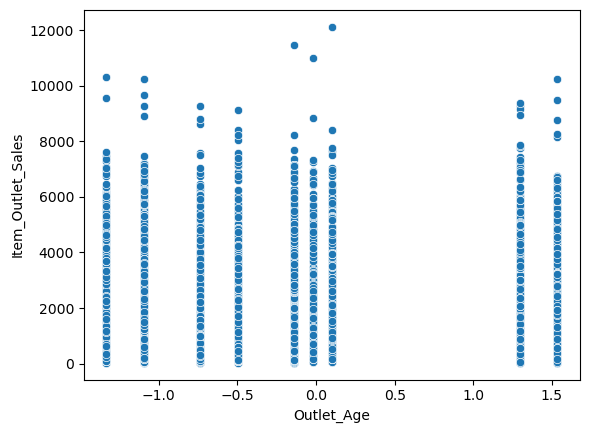

In [119]:
sns.scatterplot(x=scale_train_x['Outlet_Age'],y=train_y)

In [120]:
reg.fit(scale_train_x[['Outlet_Age']],train_y)

LinearRegression()

In [121]:
reg.intercept_

2167.583479847463

In [122]:
reg.coef_

array([67.04426364])

In [123]:
train_predict_Outlet_Age=reg.predict(scale_train_x[['Outlet_Age']])

Text(0, 0.5, 'Item_Outlet_Sales')

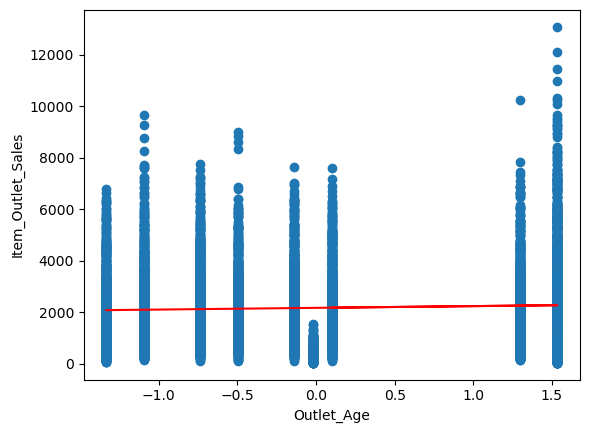

In [124]:
plt.scatter(scale_train_x['Outlet_Age'],train_y)
plt.plot(scale_train_x['Outlet_Age'],reg.predict(scale_train_x[['Outlet_Age']]),color='red')
plt.xlabel('Outlet_Age')
plt.ylabel('Item_Outlet_Sales')

In [125]:
test_predict_Outlet_Age = reg.predict(scale_test_x[['Outlet_Age']])

Text(0, 0.5, 'Item_Outlet_Sales')

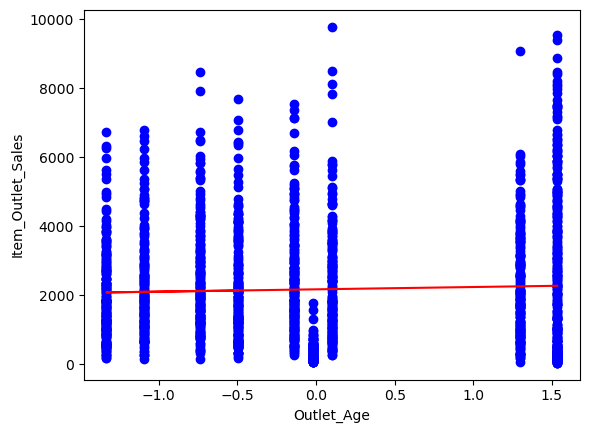

In [126]:
plt.scatter(scale_test_x['Outlet_Age'], test_y, color = 'blue')
plt.plot(scale_test_x['Outlet_Age'], reg.predict(scale_test_x[['Outlet_Age']]), color = 'red')
plt.xlabel("Outlet_Age")
plt.ylabel('Item_Outlet_Sales')

Text(0, 0.5, 'Item_Outlet_Sales')

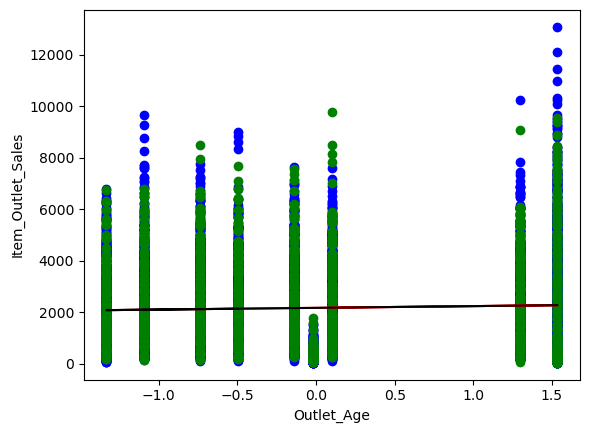

In [127]:
plt.scatter(scale_train_x['Outlet_Age'], train_y, color = 'blue')
plt.scatter(scale_test_x['Outlet_Age'], test_y, color = 'green')
plt.plot(scale_train_x['Outlet_Age'], reg.predict(scale_train_x[['Outlet_Age']]), color = 'red')
plt.plot(scale_test_x['Outlet_Age'], reg.predict(scale_test_x[['Outlet_Age']]), color = 'black')
plt.xlabel("Outlet_Age")
plt.ylabel('Item_Outlet_Sales')

In [128]:
print('TRAIN ERROR')
returnerror(train_y,reg.predict(scale_train_x[['Outlet_Age']]))

TRAIN ERROR
MSE =  2862533.633779449
RMSE =  1691.9023712316998
MAE =  1336.0568770128175
MAPE =  2.227265091003459
R2 Score =  0.0015678020575546903


In [129]:
print('TEST ERROR')
returnerror(test_y,reg.predict(scale_test_x[['Outlet_Age']]))

TEST ERROR
MSE =  3076004.2209648816
RMSE =  1753.854104811709
MAE =  1371.1386399326047
MAPE =  2.1072216596562487
R2 Score =  0.0035860776101654945


In [130]:
#Test error greater than train error

# multiple linear regression

In [134]:
reg = LinearRegression()

In [135]:
reg.fit(scale_train_x, train_y)

LinearRegression()

In [136]:
reg.intercept_

2167.809175818058

In [137]:
reg.coef_

array([-6.37134012e+11, -6.37134012e+11, -1.67961180e+15, -1.08897845e+15,
       -7.45697372e+14, -1.69155789e+15, -1.71218471e+15, -1.92360803e+15,
       -2.22233130e+15, -9.83379077e+14, -7.92458275e+14, -1.01543037e+15,
       -1.38284369e+15, -4.65792792e+14, -5.37377590e+14, -2.22805004e+15,
       -1.41523229e+15, -8.05090861e+14,  4.24934428e+14, -5.56669102e+14,
       -2.25116633e+14,  3.22939587e+14, -5.54412698e+12,  1.95752473e+14,
       -2.37653178e+14, -2.45305419e+14, -5.79677831e+14,  1.12033492e+14,
        1.23026942e+14, -1.45899736e+15, -4.63632793e+14,  3.34946981e+14,
       -1.14290247e+14, -3.94136481e+14, -4.18355124e+14,  3.60417237e+14,
        5.49478520e+14,  5.67883451e+14,  1.89500641e+14,  2.93027806e+14,
       -9.43584922e+14, -1.11855564e+01, -1.22755208e+01,  9.68183482e+02,
        1.25847085e+14])

In [138]:
train_predict = reg.predict(scale_train_x)

In [139]:
train_predict

array([2359.62566381, 3032.12150404, 3968.37371069, ..., 2994.4389539 ,
       2380.24222314, 2389.96617438])

In [141]:
test_predict = reg.predict(scale_test_x)

In [142]:
test_predict

array([2692.15275404, 3788.76566064, 1280.16409814, ..., 2793.9077039 ,
       3764.12242438, 3633.22659814])

In [144]:
def returnError(actual,pred):
    mse = mean_squared_error(actual,pred)
    rmse = np.sqrt(mean_squared_error(actual,pred))
    mae = mean_absolute_error(actual,pred)
    mape = mean_absolute_percentage_error(actual,pred)
    r2 = r2_score(actual,pred)
    print("MSE = ", mse)
    print("RMSE = ", rmse)
    print("MAE = ", mae)
    print("MAPE = ", mape)
    print("R2 Score = ", r2)

In [145]:
print("TRAIN ERROR")
returnError(train_y, reg.predict(scale_train_x))


TRAIN ERROR
MSE =  1237786.0365380899
RMSE =  1112.5583294992177
MAE =  824.6931305943287
MAPE =  1.0391950453938628
R2 Score =  0.5682686769302736


In [146]:
print("TEST ERROR")
returnError(test_y, reg.predict(scale_test_x))

TEST ERROR
MSE =  1406105.439481828
RMSE =  1185.7931689303273
MAE =  875.6980150924406
MAPE =  0.9976158285249527
R2 Score =  0.5445184936032745


In [147]:
#train error less than test error

In [148]:
residual = train_y-train_predict

<Axes: xlabel='Item_Outlet_Sales', ylabel='Density'>

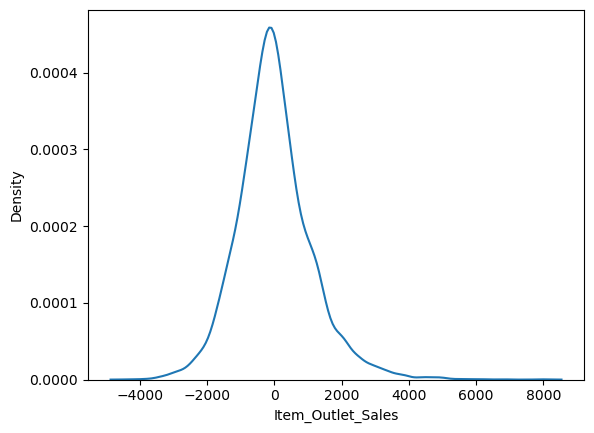

In [149]:
sns.kdeplot(residual)

<Axes: ylabel='Item_Outlet_Sales'>

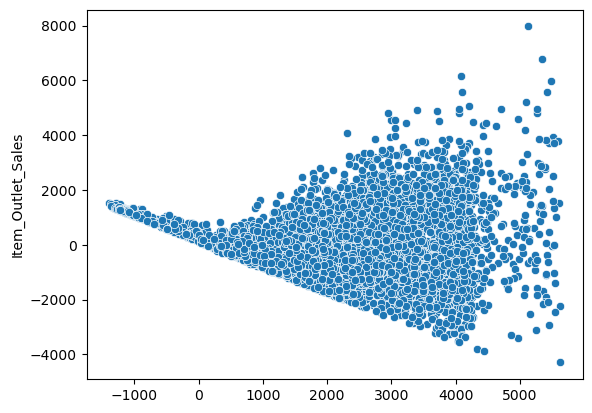

In [150]:
sns.scatterplot(x = train_predict, y = residual)

<Axes: ylabel='Item_Outlet_Sales'>

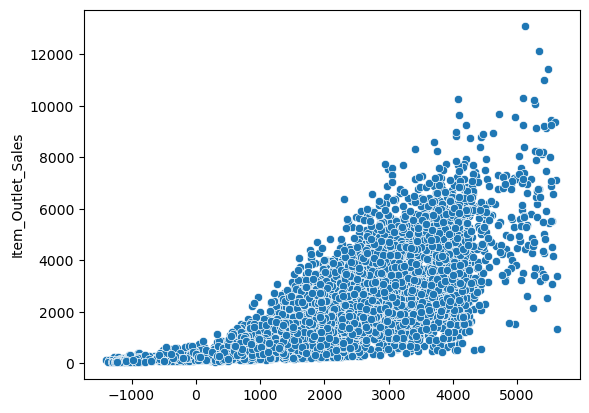

In [151]:
sns.scatterplot(x = train_predict,y= train_y )